# Cost-Sensitive Learning

This notebook evaluates the use of **class weights** as a strategy for handling class imbalance. Instead of resampling the data, we assign higher sample weights to minority-class examples during training. The weight factor is set proportional to the imbalance ratio of each dataset, and multiple weight multipliers are tested per dataset to find the most effective cost assignment.

All six ensemble base estimators (`rf`, `ada`, `gbm`, `cat`, `lgbm`, `xgb`) are evaluated with their class weighted variants. Because the imbalance ratio differs across datasets, the model names — and therefore the number of variants — vary from dataset to dataset. The "Best CW variant" section at the end of the notebook selects, for each base model and dataset, the weight multiplier that achieves the highest performance.

The notebook produces per-dataset error-bar plots for ROC-AUC, AP, Recall, F1, MCC, Balanced Accuracy, and Brier score, each preceded by a Friedman + Nemenyi significance test. Figures are saved as `csl_*.png`.

In [1]:
import sys
sys.path.insert(1, '../')

In [2]:
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from functions.data import DATASETS_LS as datasets
from functions.analysis import create_df, create_fold_df, best_performance_summary
from functions.statistical_tests import apply_friedman_test, apply_nemenyi_test
from functions.plotting import compute_ylim, add_significance_bars


## Load results

In [3]:
with open('../models/ensembles/results', 'rb') as f:
    scores_baseline = pickle.load(f)

with open('../models/csl/results.pkl', 'rb') as f:
    scores_csl = pickle.load(f)

with open('../models/ensembles/results_folds', 'rb') as f:
    folds_baseline = pickle.load(f)

with open('../models/csl/results_folds.pkl', 'rb') as f:
    folds_csl = pickle.load(f)

# Merge baseline and CSL results into a single dict
scores_dict = {
    dataset: {**scores_baseline[dataset], **scores_csl[dataset]}
    for dataset in scores_baseline
}

folds_dict = {
    dataset: {**folds_baseline[dataset], **folds_csl[dataset]}
    for dataset in folds_baseline
}


In [4]:
# the model keys change with the dataset
# (different from other notebooks where 
# names were always the same)

models = list(scores_dict[datasets[0]].keys())
models

['rf',
 'ada',
 'gbm',
 'cat',
 'lgbm',
 'xgb',
 'rf_sw138',
 'rf_sw69',
 'rf_sw46',
 'ada_sw138',
 'ada_sw69',
 'ada_sw46',
 'gbm_sw138',
 'gbm_sw69',
 'gbm_sw46',
 'cat_sw138',
 'cat_sw69',
 'cat_sw46',
 'lgbm_sw138',
 'lgbm_sw69',
 'lgbm_sw46',
 'xgb_sw138',
 'xgb_sw69',
 'xgb_sw46']

In [5]:
# test function

df = create_df(scores_dict, datasets[0], models)
df

,roc,roc_std,ap,ap_std,precision,precision_std,recall,recall_std,f1_score,f1_std,mcc,mcc_std,ba,ba_std,brier,brier_std,gmean,gmean_std,thresh,tresh_std
rf,0.807908,0.092538,0.037444,0.018438,0.056745,0.028469,0.442381,0.198271,0.098943,0.046668,0.154355,0.056203,0.808797,0.066870,0.006558,0.001798,0.796202,0.069239,0.022879,0.001893
ada,0.868558,0.044778,0.043142,0.017950,0.067248,0.038081,0.514286,0.280346,0.102454,0.045972,0.162647,0.039149,0.867453,0.048209,0.159425,0.001084,0.855384,0.056777,0.451197,0.018711
gbm,0.807574,0.060397,0.038474,0.008907,0.065640,0.017391,0.370476,0.074286,0.109875,0.023704,0.153734,0.023203,0.812821,0.050938,0.006612,0.001860,0.792321,0.058453,0.012872,0.001963
cat,0.852072,0.042781,0.031280,0.009262,0.044449,0.014452,0.564286,0.265516,0.081029,0.025260,0.160395,0.027133,0.867838,0.046871,0.006700,0.001839,0.864576,0.044867,0.018670,0.006695
lgbm,0.808396,0.069861,0.036326,0.018519,0.062891,0.032798,0.442381,0.198271,0.108403,0.053713,0.165249,0.062476,0.817232,0.029310,0.006597,0.001803,0.795724,0.035877,0.028026,0.001663
xgb,0.764861,0.100864,0.027050,0.009628,0.044150,0.012482,0.370952,0.206506,0.077645,0.023798,0.127909,0.042711,0.780107,0.064957,0.006720,0.001865,0.756010,0.086404,0.031224,0.006540
rf_sw138,0.789666,0.056498,0.025688,0.009108,0.040750,0.017928,0.485714,0.280346,0.069942,0.027735,0.117654,0.020560,0.818635,0.038028,0.109928,0.006295,0.805763,0.032414,0.593846,0.158113
rf_sw69,0.806388,0.058575,0.041477,0.011396,0.074675,0.020711,0.353810,0.088699,0.121536,0.028500,0.160391,0.023767,0.814848,0.050498,0.096130,0.002715,0.798015,0.053185,0.539596,0.000423
rf_sw46,0.796279,0.059640,0.026499,0.009737,0.039769,0.016098,0.529048,0.204421,0.071127,0.026211,0.121743,0.017593,0.823894,0.037215,0.043469,0.003027,0.814480,0.036845,0.376557,0.130777
ada_sw138,0.863037,0.047081,0.038978,0.014999,0.056059,0.026046,0.564286,0.265516,0.098137,0.042320,0.160502,0.043348,0.863976,0.049099,0.188619,0.001366,0.852917,0.055599,0.495376,0.016864


## Datasets

In [6]:
len(datasets)

37

## ROC-AUC Friedman test

In [7]:
friedman_rows = []
nemenyi_dict = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "roc")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict[data] = apply_nemenyi_test(df)

friedman_df = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df

,statistic,pvalue
dataset,,
abalone_19,67.979734,2.483949e-06
car_eval_4,77.448700,8.178661e-08
coil_2000,56.344000,1.266906e-04
ecoli,63.155343,1.319839e-05
isolet,98.767177,2.296462e-11
letter_img,91.564371,3.877649e-10
libras_move,54.848238,2.046177e-04
mammography,100.120000,1.342284e-11
oil,61.568245,2.259700e-05


## Plot ROC-AUC

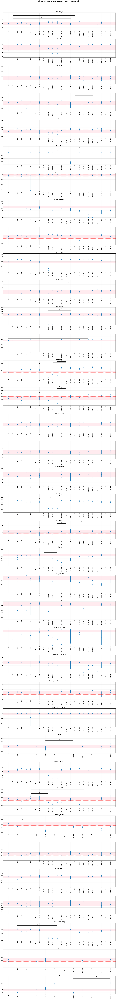

In [8]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 0]
    stds = df.iloc[:, 1]

    upper = df.iloc[0, 0] + df.iloc[0, 1]
    lower = df.iloc[0, 0] - df.iloc[0, 1]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict:
        best_model = means.idxmax()
        posthoc = nemenyi_dict[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (ROC-AUC mean ± std)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_rocauc.png', dpi=300, bbox_inches='tight')
plt.show()

### ROC-AUC conclusion

Although some of the variants with class weights tend to show higher values of ROC-AUC, they don't consistently outperform significantly the same model without class weight or other ensembles without class-weights. In the case of credit-fraud, gbm seems to suffer from the class imbalance and hence applying class weights improves the performance of this particular model, but other ensembles outperform or perform at least as well as the gbm with class weight.

## Average Precision Friedman test

In [9]:
friedman_rows = []
nemenyi_dict_ap = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "ap")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_ap[data] = apply_nemenyi_test(df)

friedman_df_ap = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_ap

,statistic,pvalue
dataset,,
abalone_19,56.120000,1.361785e-04
car_eval_4,85.810869,3.549301e-09
coil_2000,39.872000,1.588454e-02
ecoli,51.106929,6.580593e-04
isolet,98.392000,2.664366e-11
letter_img,91.847602,3.473578e-10
libras_move,60.969840,2.763124e-05
mammography,104.312000,2.513365e-12
oil,64.264765,9.030768e-06


## Plot average precision

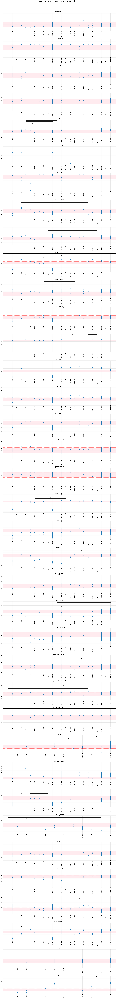

In [10]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 2]
    stds = df.iloc[:, 3]

    upper = df.iloc[0, 2] + df.iloc[0, 3]
    lower = df.iloc[0, 2] - df.iloc[0, 3]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_ap:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_ap[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Precision)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_ap.png', dpi=300, bbox_inches='tight')
plt.show()

### Average Precision conclusion

Similarly to ROC-AUC, for AP, models without class weight perform as competitively as those with class weights.

## Recall Friedman test

In [11]:
friedman_rows = []
nemenyi_dict_recall = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "recall")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_recall[data] = apply_nemenyi_test(df)

friedman_df_recall = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_recall

,statistic,pvalue
dataset,,
abalone_19,19.328831,6.819824e-01
car_eval_4,19.107692,6.949565e-01
coil_2000,25.011491,3.496931e-01
ecoli,48.949562,1.262739e-03
isolet,73.877928,3.020078e-07
letter_img,84.428143,6.004300e-09
libras_move,57.030942,1.014295e-04
mammography,65.732386,5.442953e-06
oil,45.354580,3.595298e-03


## Plot Recall

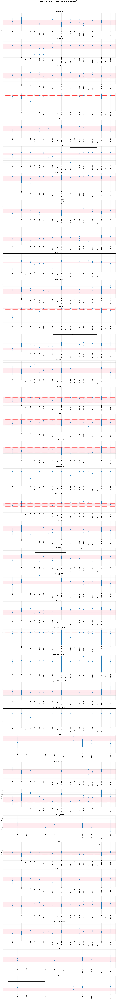

In [12]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 6]
    stds = df.iloc[:, 7]

    upper = df.iloc[0, 6] + df.iloc[0, 7]
    lower = df.iloc[0, 6] - df.iloc[0, 7]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_recall:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_recall[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Recall)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_recall.png', dpi=300, bbox_inches='tight')
plt.show()

### Recall conclusion

Similarly to ROC-AUC, for Recall, models without class weight perform as competitively as those with class weights.

## F1-score Friedman test

In [13]:
friedman_rows = []
nemenyi_dict_f1 = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "f1")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_f1[data] = apply_nemenyi_test(df)

friedman_df_f1 = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_f1

,statistic,pvalue
dataset,,
abalone_19,39.809312,1.614274e-02
car_eval_4,85.788721,3.579388e-09
coil_2000,58.495260,6.285538e-05
ecoli,69.553877,1.424881e-06
isolet,82.919418,1.062382e-08
letter_img,91.072874,4.692500e-10
libras_move,59.879362,3.977018e-05
mammography,86.689073,2.538361e-09
oil,52.853278,3.836573e-04


## Plot f1-score

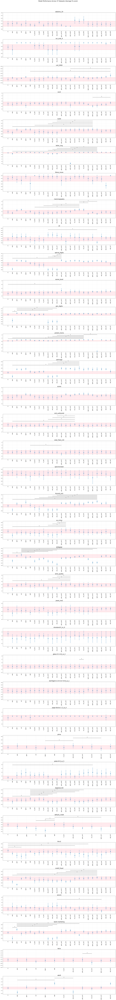

In [14]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 8]
    stds = df.iloc[:, 9]

    upper = df.iloc[0, 8] + df.iloc[0, 9]
    lower = df.iloc[0, 8] - df.iloc[0, 9]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_f1:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_f1[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average f1-score)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_f1.png', dpi=300, bbox_inches='tight')
plt.show()

### F1-score conclusion

Similarly to ROC-AUC, for f1-score, models without class weight perform as competitively as those with class weights.

## MCC Friedman test

In [15]:
friedman_rows = []
nemenyi_dict_mcc = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "mcc")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_mcc[data] = apply_nemenyi_test(df)

friedman_df_mcc = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_mcc

,statistic,pvalue
dataset,,
abalone_19,45.729812,3.231311e-03
car_eval_4,85.788721,3.579388e-09
coil_2000,46.420073,2.651119e-03
ecoli,69.950826,1.237579e-06
isolet,83.198693,9.561206e-09
letter_img,91.072874,4.692500e-10
libras_move,59.879362,3.977018e-05
mammography,87.829285,1.640116e-09
oil,55.944019,1.441132e-04


## Plot MCC

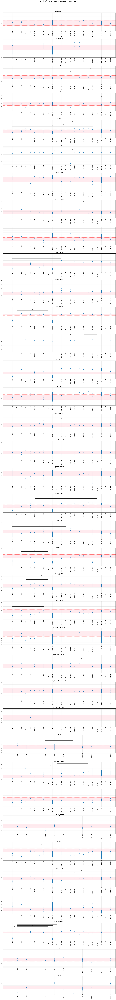

In [16]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 10]
    stds = df.iloc[:, 11]

    upper = df.iloc[0, 10] + df.iloc[0, 11]
    lower = df.iloc[0, 10] - df.iloc[0, 11]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_mcc:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_mcc[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average MCC)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_mcc.png', dpi=300, bbox_inches='tight')
plt.show()

### MCC conclusion

Ensembles without class weight are never unanimosuly beaten by their counterparts with class weights.

## Balanced Accuracy Friedman test

In [17]:
friedman_rows = []
nemenyi_dict_ba = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "ba")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_ba[data] = apply_nemenyi_test(df)

friedman_df_ba = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_ba

,statistic,pvalue
dataset,,
abalone_19,55.425737,1.701791e-04
car_eval_4,85.913649,3.412926e-09
coil_2000,35.793112,4.330261e-02
ecoli,72.199584,5.537780e-07
isolet,96.524295,5.570789e-11
letter_img,88.769731,1.142573e-09
libras_move,62.149318,1.857206e-05
mammography,95.470905,8.430845e-11
oil,56.230965,1.313952e-04


## Balanced accuracy

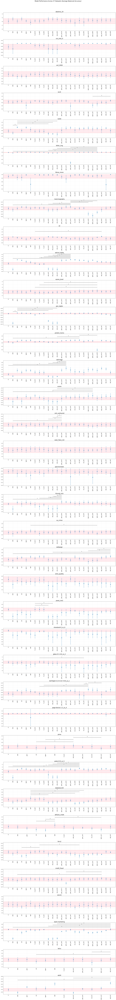

In [18]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 12]
    stds = df.iloc[:, 13]

    upper = df.iloc[0, 12] + df.iloc[0, 13]
    lower = df.iloc[0, 12] - df.iloc[0, 13]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_ba:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_ba[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Balanced Accuracy)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_ba.png', dpi=300, bbox_inches='tight')
plt.show()

### Balanced Accuracy conclusion

Ensembles without class weight are never unanimosuly beaten by their counterparts with class weights.

## Brier Score Friedman test

In [19]:
friedman_rows = []
nemenyi_dict_brier = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "brier")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_brier[data] = apply_nemenyi_test(df)

friedman_df_brier = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_brier

,statistic,pvalue
dataset,,
abalone_19,114.424000,4.142928e-14
car_eval_4,110.616000,1.963675e-13
coil_2000,113.776000,5.403190e-14
ecoli,94.648000,1.164358e-10
isolet,107.584000,6.721277e-13
letter_img,102.336000,5.547902e-12
libras_move,92.456000,2.741450e-10
mammography,113.488000,6.079509e-14
oil,86.984000,2.267573e-09


## Brier score

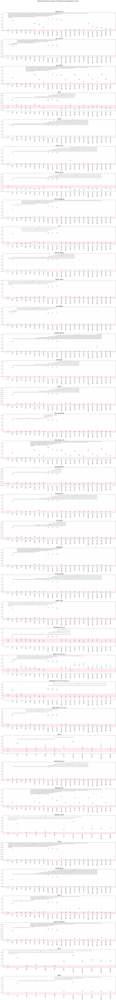

In [20]:
# One row per dataset; each dataset has a different number/set of
# CSL sample-weight variants, so the model list is computed per dataset
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(24, 5.5 * len(datasets)))
axes = axes.ravel()

for i, data in enumerate(datasets):

    # get models name
    models = list(scores_dict[data].keys())

    # create df with results
    df = create_df(scores_dict, data, models)

    ax = axes[i]

    cls = df.index
    means = df.iloc[:, 14]
    stds = df.iloc[:, 15]

    upper = df.iloc[0, 14] + df.iloc[0, 15]
    lower = df.iloc[0, 14] - df.iloc[0, 15]

    # Determine significant comparisons (if any) up front, so we can
    # reserve extra headroom above the data for the significance bars
    best_model = None
    sig_models = []
    if data in nemenyi_dict_brier:
        best_model = means.idxmin()
        posthoc = nemenyi_dict_brier[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=cls, y=means, yerr=stds, fmt='o', capsize=5, markersize=8)

    ax.set_title(data, fontsize=20)
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        # reserve headroom above the data for the significance bars
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    # If the Friedman test was significant, draw Nemenyi significance bars
    # from the best performing model to each model significantly worse than it
    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Brier score)', fontsize=20, y=1.01)
plt.savefig('../figures/csl_brier.png', dpi=300, bbox_inches='tight')
plt.show()

### Brier Score conclusion

The increase in the Brier score with the use of class weights reflects the distortion in the probability calibration of the ensembles.

## Best CSL variant per model and dataset

### ROC-AUC

In [21]:
best_performance_summary(scores_dict, datasets, metric='roc', metric_std='roc_std')

,dataset,model,roc,roc_std,best_csl_variant,best_csl_roc,best_csl_roc_std,roc_diff
0,abalone_19,rf,0.807908,0.092538,rf_sw69,0.806388,0.058575,-0.001520
1,abalone_19,ada,0.868558,0.044778,ada_sw138,0.863037,0.047081,-0.005521
2,abalone_19,gbm,0.807574,0.060397,gbm_sw138,0.804612,0.067775,-0.002961
3,abalone_19,cat,0.852072,0.042781,cat_sw69,0.825805,0.081477,-0.026266
4,abalone_19,lgbm,0.808396,0.069861,lgbm_sw138,0.838490,0.057035,0.030094
5,abalone_19,xgb,0.764861,0.100864,xgb_sw138,0.846260,0.058396,0.081399
6,car_eval_4,rf,0.998384,0.001298,rf_sw24,0.999351,0.000698,0.000967
7,car_eval_4,ada,0.998113,0.002561,ada_sw24,0.998113,0.002561,0.000000
8,car_eval_4,gbm,1.000000,0.000000,gbm_sw24,1.000000,0.000000,0.000000
9,car_eval_4,cat,1.000000,0.000000,cat_sw8,1.000000,0.000000,0.000000


### AP

In [22]:
best_performance_summary(scores_dict, datasets, metric='ap', metric_std='ap_std')

,dataset,model,ap,ap_std,best_csl_variant,best_csl_ap,best_csl_ap_std,ap_diff
0,abalone_19,rf,0.037444,0.018438,rf_sw69,0.041477,0.011396,0.004033
1,abalone_19,ada,0.043142,0.017950,ada_sw46,0.040893,0.017648,-0.002249
2,abalone_19,gbm,0.038474,0.008907,gbm_sw138,0.027191,0.007437,-0.011283
3,abalone_19,cat,0.031280,0.009262,cat_sw46,0.067433,0.036774,0.036153
4,abalone_19,lgbm,0.036326,0.018519,lgbm_sw46,0.034065,0.017364,-0.002261
5,abalone_19,xgb,0.027050,0.009628,xgb_sw69,0.037375,0.016282,0.010325
6,car_eval_4,rf,0.947226,0.042155,rf_sw24,0.976478,0.026314,0.029252
7,car_eval_4,ada,0.955615,0.049933,ada_sw24,0.955615,0.049933,0.000000
8,car_eval_4,gbm,1.000000,0.000000,gbm_sw24,1.000000,0.000000,0.000000
9,car_eval_4,cat,1.000000,0.000000,cat_sw8,1.000000,0.000000,0.000000


### balanced accuracy

In [23]:
best_performance_summary(scores_dict, datasets, metric='ba', metric_std='ba_std')

,dataset,model,ba,ba_std,best_csl_variant,best_csl_ba,best_csl_ba_std,ba_diff
0,abalone_19,rf,0.808797,0.066870,rf_sw46,0.823894,0.037215,0.015097
1,abalone_19,ada,0.867453,0.048209,ada_sw138,0.863976,0.049099,-0.003477
2,abalone_19,gbm,0.812821,0.050938,gbm_sw138,0.831943,0.056028,0.019122
3,abalone_19,cat,0.867838,0.046871,cat_sw69,0.825693,0.072549,-0.042144
4,abalone_19,lgbm,0.817232,0.029310,lgbm_sw138,0.840288,0.043074,0.023056
5,abalone_19,xgb,0.780107,0.064957,xgb_sw138,0.840448,0.059015,0.060341
6,car_eval_4,rf,0.997671,0.001706,rf_sw24,0.998680,0.001226,0.001009
7,car_eval_4,ada,0.996346,0.003224,ada_sw24,0.996346,0.003224,0.000000
8,car_eval_4,gbm,1.000000,0.000000,gbm_sw24,1.000000,0.000000,0.000000
9,car_eval_4,cat,1.000000,0.000000,cat_sw8,1.000000,0.000000,0.000000


## Join datasets and create table

In [24]:
# dfs = [create_df(scores_dict, data, models) for data in datasets]
# result = pd.concat(dfs, keys=datasets, names=['dataset', 'model'])
# result

In [25]:
# result['roc_±_std'] = result['roc'].round(3).astype(str) + '±' + result['roc_std'].round(3).astype(str)
# result['ap_±_std'] = result['ap'].round(3).astype(str) + '±' + result['ap_std'].round(3).astype(str)
# result['recall_±_std'] = result['recall'].round(3).astype(str) + '±' + result['recall_std'].round(3).astype(str)
# result['thresh_±_std'] = result['thresh'].round(3).astype(str) + '±' + result['tresh_std'].round(3).astype(str)

# result.to_csv('../results/csl_models_performance.csv', index=True)

# result[['roc_±_std', 'ap_±_std', 'recall_±_std', 'thresh_±_std']]